In [ ]:
!pip install  keras-nightly segmentation-models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.5 MB/s eta 0:00:00


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import os

import keras

print("Keras = {}".format(keras.__version__))
import tensorflow as tf

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # or any {'0', '1', '2'}
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import seaborn as sns
import pandas as pd


# Print gpus
gpus = tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(gpus))



Keras = 3.7.0.dev2024102803
Num GPUs Available:  1


In [ ]:
model_dir = 'drive/MyDrive/models/'
model_file = model_dir + 'unetpp_pneumonia.keras'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# ! unzip -o drive/MyDrive/dataset.zip

! pwd

/content


In [ ]:
# Data Directories
dir = "drive/MyDrive/dataset/chest_xray/"
train_dir = os.path.join(dir, 'train')
test_dir = os.path.join(dir, 'test')
val_dir = os.path.join(dir, 'val')
dirs = {'Train': train_dir, 'Test': test_dir, 'Validation': val_dir}

<ipython-input-8-95fe55cc857f>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-8-95fe55cc857f>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
<ipython-input-8-95fe55cc857f>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


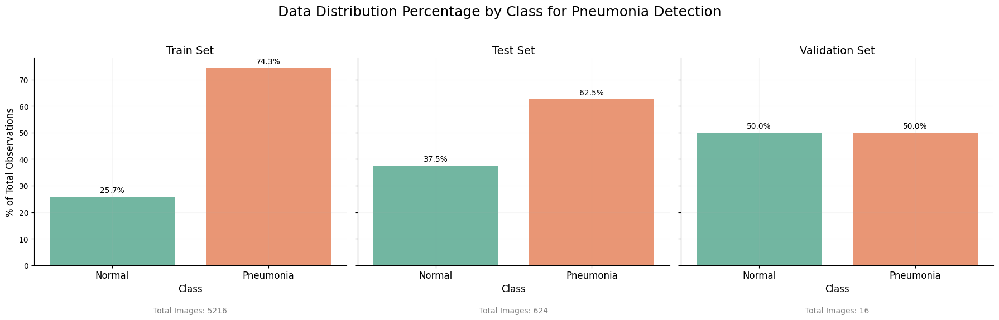

In [ ]:
# Plot settings
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
fig.suptitle("Data Distribution Percentage by Class for Pneumonia Detection", fontsize=18)

# Colors for classes
colors = ['#66c2a5', '#fc8d62']  # Greenish for Normal, Salmon for Pneumonia

# Loop through each directory and plot
for i, (title, directory) in enumerate(dirs.items()):
    # Calculate class distribution, ensure 'Normal' comes before 'Pneumonia'
    data_distribution_count = pd.Series({
        curr_index: len(os.listdir(os.path.join(directory, curr_index)))
        for curr_index in sorted(os.listdir(directory))
    })

    # Plot each directory distribution
    sns.barplot(
        x=[label.replace('_', ' ').title() for label in data_distribution_count.index],
        y=100 * data_distribution_count / data_distribution_count.sum(),
        ax=axes[i],
        palette=colors
    )

    # Aesthetics for each subplot
    axes[i].grid(True, alpha=0.1)
    axes[i].set_title(f"{title} Set", fontsize=14)
    axes[i].set_xlabel("Class", fontsize=12)
    if i == 0:
        axes[i].set_ylabel("% of Total Observations", fontsize=12)

    # Add data labels above each bar
    for bar, percentage in zip(axes[i].patches, 100 * data_distribution_count / data_distribution_count.sum()):
        axes[i].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 1,
            f'{percentage:.1f}%',
            ha='center',
            va='bottom',
            fontdict=dict(size=10, color='black')
        )

    # Annotation for total images per set
    axes[i].text(0.5, -0.2, f'Total Images: {data_distribution_count.sum()}',
                 ha='center', va='top', transform=axes[i].transAxes, fontdict=dict(size=10, color='gray'))
    axes[i].tick_params(axis='x', labelsize=12)

# Final adjustments
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust for the suptitle
plt.show()

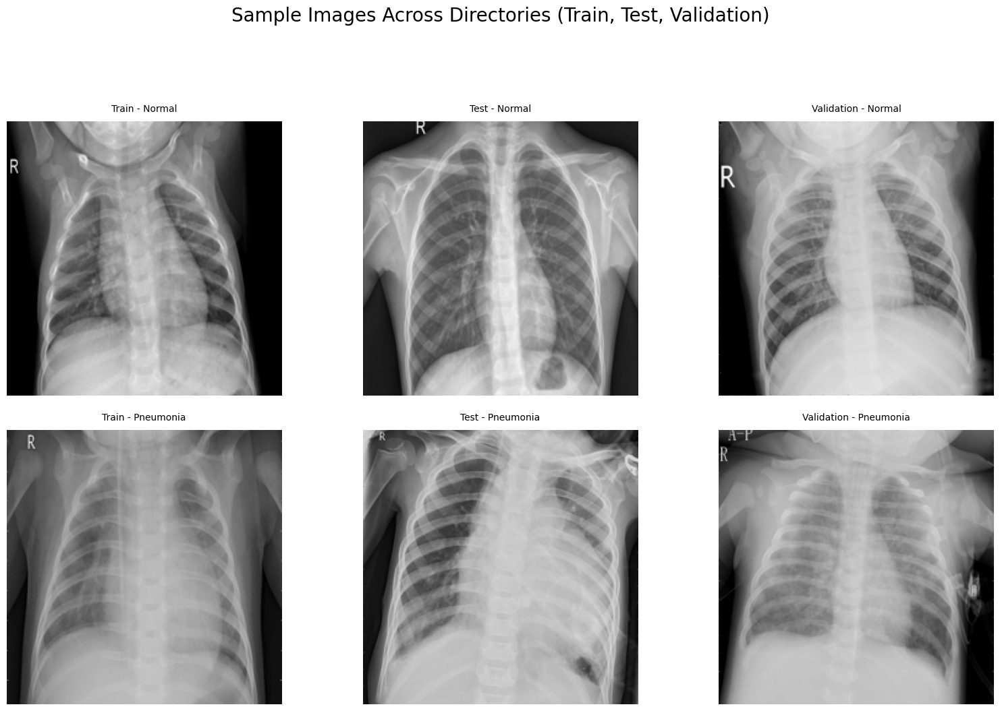

In [ ]:
from PIL import Image

# Display images from multiple directories side-by-side with uniform sizing
def display_images_by_directory(directories, target_size=(224, 224)):
    img_count_per_class = 1  # Number of images per class to display
    class_folders = sorted(os.listdir(next(iter(directories.values()))))  # Get class names from one directory
    num_classes = len(class_folders)
    num_dirs = len(directories)

    # Create a figure for side-by-side display
    fig, axes = plt.subplots(num_classes, img_count_per_class * num_dirs, figsize=(16, 10))
    fig.suptitle("Sample Images Across Directories (Train, Test, Validation)", fontsize=20, y=1.05)

    # Loop through each directory and class, resizing images for consistency
    for col, (dir_name, dir_path) in enumerate(directories.items()):
        for row, class_name in enumerate(class_folders):
            class_path = os.path.join(dir_path, class_name)
            img_files = os.listdir(class_path)[:img_count_per_class]

            for img_index, img_file in enumerate(img_files):
                img_path = os.path.join(class_path, img_file)
                image = Image.open(img_path).convert("RGB")  # Ensure all images are RGB
                image = image.resize(target_size)  # Resize to target size for consistency

                # Positioning in the subplot grid
                ax = axes[row, col * img_count_per_class + img_index]

                # Display each image with improved formatting
                ax.imshow(image)
                ax.axis('off')
                ax.set_title(f"{dir_name} - {class_name.title()}", fontsize=10, pad=10)

    # Adjust layout for a clear, balanced presentation
    plt.tight_layout(w_pad=2, h_pad=2)
    plt.subplots_adjust(top=0.88)
    plt.show()

display_images_by_directory(dirs)

# Split Data

In [ ]:
# classes = os.listdir(train_dir)

batch_size = 16

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    horizontal_flip=True,
    vertical_flip=False,         # Vertical flips might not be ideal for medical images
    # rotation_range=20,           # Slight rotation to adjust for orientation variations
    # width_shift_range=0.1,       # Horizontal shifts to simulate slightly varied chest X-ray positioning
    # height_shift_range=0.1,      # Vertical shifts as above
    brightness_range=[0.8, 1.2], # Brightness adjustment to simulate different exposure levels
    # zoom_range=0.15,             # Minor zoom to vary scale slightly
    # shear_range=0.15             # Shear to simulate varied angles in X-ray imaging
)

# Testing data generator with minimal augmentation to evaluate performance
test_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    brightness_range=[0.9, 1.1],  # Mild brightness adjustment only
)

# Validation data generator with only rescaling as it serves as a control set
validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    seed=42
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    seed=42,
    shuffle = False)

validation_generator = validation_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    seed=42,
    shuffle = False)

print(f'Train: {len(train_generator)} batches')
print(f'Test: {len(test_generator)} batches')
print(f'Validation: {len(validation_generator)} batches')
print(test_generator.class_indices)


Found 5216 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Train: 326 batches
Test: 39 batches
Validation: 1 batches
{'NORMAL': 0, 'PNEUMONIA': 1}


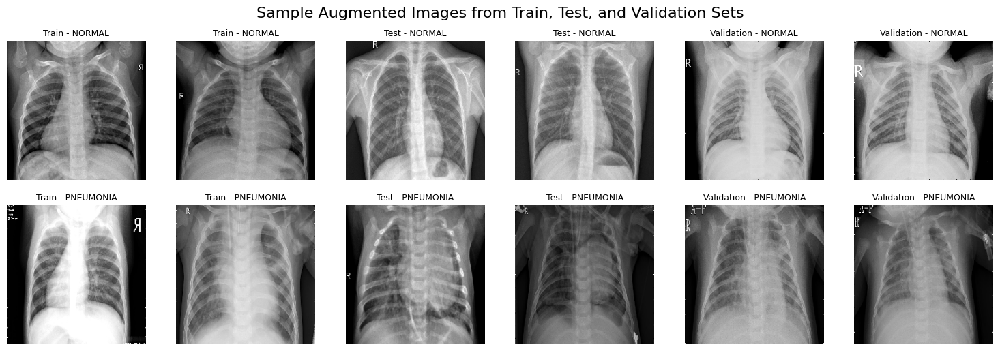

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_images_from_generators(generators, num_images_per_class=2):
    """
    Plot images from multiple image generators for comparison.
    :param generators: Dictionary with generator name as key (e.g., 'Train') and generator object as value.
    :param num_images_per_class: Number of images per class to display from each generator.
    """
    # Use the class labels from the first generator
    class_indices = next(iter(generators.values())).class_indices
    class_names = list(class_indices.keys())
    num_classes = len(class_names)
    num_generators = len(generators)

    # Create a mobile-friendly figure size
    fig, axes = plt.subplots(num_classes, num_images_per_class * num_generators,
                             figsize=(num_images_per_class * num_generators * 2.5, num_classes * 2.5))
    fig.suptitle("Sample Augmented Images from Train, Test, and Validation Sets", fontsize=16, y=1.02)

    # Loop over each generator to display images
    for g_index, (gen_name, generator) in enumerate(generators.items()):
        # Track images plotted for each class
        images_per_class = {class_name: 0 for class_name in class_names}

        # Loop through batches from the generator
        for batch_x, batch_y in generator:
            for i in range(len(batch_x)):
                img = batch_x[i]
                label_index = np.argmax(batch_y[i])
                label_name = class_names[label_index]

                # Only display if within the limit for this class
                if images_per_class[label_name] < num_images_per_class:
                    row = list(class_indices.keys()).index(label_name)
                    col = g_index * num_images_per_class + images_per_class[label_name]
                    axes[row, col].imshow(img)
                    axes[row, col].axis('off')

                    # Set title for each image with the generator and class
                    axes[row, col].set_title(f"{gen_name} - {label_name}", fontsize=9, pad=5)

                    # Add a border around images
                    for spine in axes[row, col].spines.values():
                        spine.set_visible(True)
                        spine.set_linewidth(1)
                        spine.set_color('black')

                    # Increment the counter for this class
                    images_per_class[label_name] += 1

                # Stop if enough images are shown for all classes
                if all(count >= num_images_per_class for count in images_per_class.values()):
                    break
            else:
                continue
            break

    plt.tight_layout(w_pad=1.5, h_pad=2)
    plt.subplots_adjust(top=0.92)
    plt.show()

# Define the generators
generators = {
    'Train': train_generator,
    'Test': test_generator,
    'Validation': validation_generator
}

# Display images from all three generators
plot_images_from_generators(generators, num_images_per_class=2)


In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

# import tensorflow
from tensorflow import keras
from segmentation_models import Unet
# from tensorflow.keras.regularizers import l2

# Model parameters
input_shape = (224, 224, 3)
num_classes = 2
initial_learning_rate = 1e-4

# Define the U-Net++ model
model = Unet('efficientnetb1', input_shape=input_shape, classes=num_classes, activation=None)
# tensorflow.keras.utils.plot_model(model, to_file='unetpp_model.png', show_shapes=True, show_layer_names=True)

# Add a GlobalAveragePooling2D layer to collapse spatial dimensions
model = keras.Sequential([
    model,
    keras.layers.GlobalAveragePooling2D()  # Pool across spatial dimensions
])

# Add a Dense layer with softmax activation for final classification
model.add(keras.layers.Dense(num_classes, activation='softmax'))

# Compile the model
optimizer = keras.optimizers.Adam(learning_rate=initial_learning_rate)
model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Summary of the model
model.summary()
# tf.keras.utils.plot_model(model, to_file='unetpp_model2.png', show_shapes=True, show_layer_names=True)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ functional_6 (Functional)            │ (None, 224, 224, 2)         │      12,641,314 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2)                   │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │               6 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,641,320 (48.22 MB)

 Trainable params: 12,577,288 (47.98 MB)

 Non-trainable params: 64,032 (250.12 KB)

In [ ]:
from tensorflow.keras.callbacks import *
import math

# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.3, min_lr=1e-6, verbose=1)
checkpoint = ModelCheckpoint(model_file, monitor='val_loss', verbose=1, save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')


In [ ]:
import datetime

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


# Train the model
history = model.fit(
    train_generator,
    # steps_per_epoch=steps_per_epoch,
    epochs=40,
    validation_data=test_generator,
    # validation_steps=validation_steps,
    callbacks=[checkpoint, early_stopping, reduce_lr, tensorboard_callback]
)


Epoch 1/40
326/326 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.8722 - loss: 0.4936
Epoch 1: val_loss improved from inf to 0.75667, saving model to drive/MyDrive/models/unetpp_pneumonia.keras
326/326 ━━━━━━━━━━━━━━━━━━━━ 268s 386ms/step - accuracy: 0.8724 - loss: 0.4932 - val_accuracy: 0.6394 - val_loss: 0.7567 - learning_rate: 1.0000e-04
Epoch 2/40
326/326 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step - accuracy: 0.9720 - loss: 0.2039
Epoch 2: val_loss improved from 0.75667 to 0.60192, saving model to drive/MyDrive/models/unetpp_pneumonia.keras
326/326 ━━━━━━━━━━━━━━━━━━━━ 130s 398ms/step - accuracy: 0.9720 - loss: 0.2038 - val_accuracy: 0.7356 - val_loss: 0.6019 - learning_rate: 1.0000e-04
Epoch 3/40
326/326 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step - accuracy: 0.9837 - loss: 0.1062
Epoch 3: val_loss improved from 0.60192 to 0.47718, saving model to drive/MyDrive/models/unetpp_pneumonia.keras
326/326 ━━━━━━━━━━━━━━━━━━━━ 116s 356ms/step - accuracy: 0.9837 - loss: 0.1062 - val_accuracy: 0.7933 - va

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 11077), started 0:21:38 ago. (Use '!kill 11077' to kill it.)

<IPython.core.display.Javascript object>

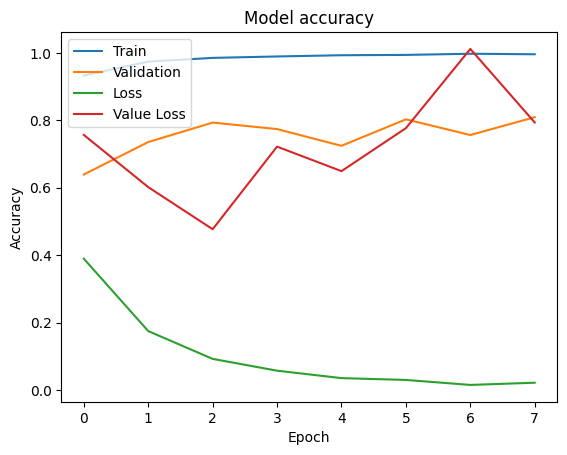

In [ ]:
# Learning curve
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

# Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation','Loss', 'Value Loss'], loc='upper left')
plt.show()

In [ ]:
# Validate the model with test data

model = keras.models.load_model(model_file)
model.evaluate(validation_generator)

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step - accuracy: 0.9375 - loss: 0.1338


[0.13380420207977295, 0.9375]

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


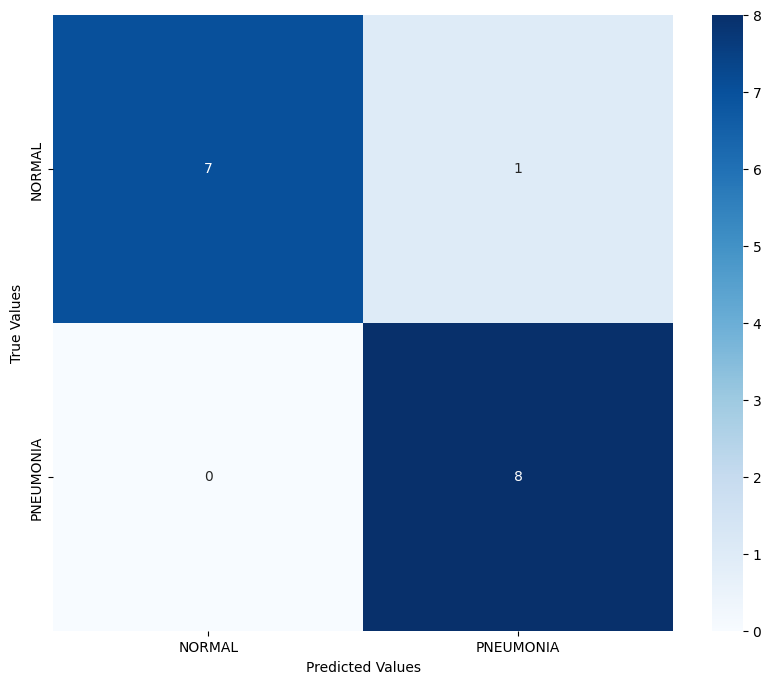

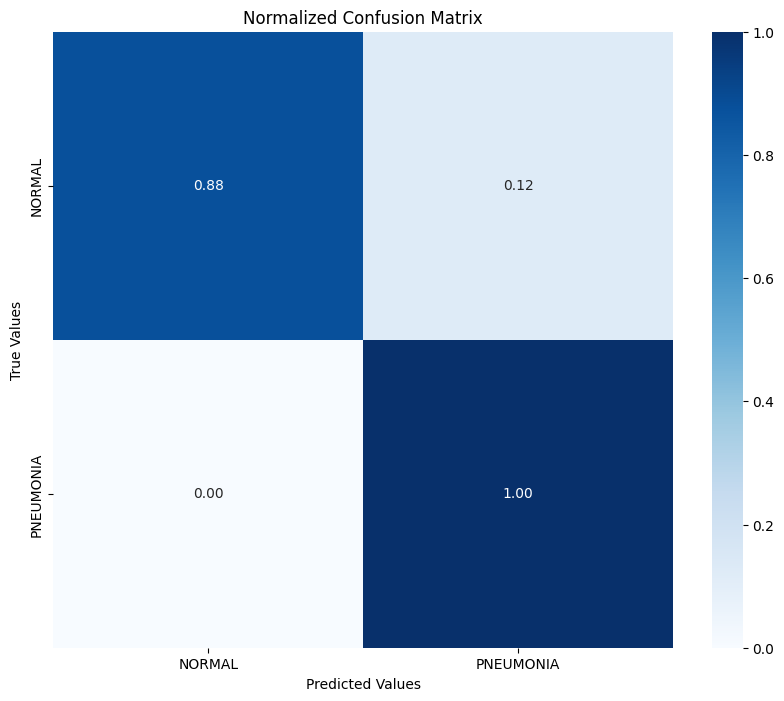

DSC: 0.9372549019607843, Sensitivity: 0.9375, Specificity: 0.9375, Accuracy: 0.9375


In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score

classes = ['NORMAL', 'PNEUMONIA']

def calculate_metrics(y_true, y_pred):
    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Plot the Confusion Matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Values')
    plt.ylabel('True Values')
    plt.show()

    # Normalize the confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Plot the normalized confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Values')
    plt.ylabel('True Values')
    plt.title('Normalized Confusion Matrix')
    plt.show()

    # Calculate metrics for each class and average them
    dsc = np.mean([2.0 * cm[i, i] / (np.sum(cm[i, :]) + np.sum(cm[:, i])) for i in range(cm.shape[0])])
    sensitivity = np.mean([cm[i, i] / np.sum(cm[i, :]) for i in range(cm.shape[0])])
    specificity = np.mean([np.sum(np.delete(np.delete(cm, j, 0), j, 1)) / np.sum(np.delete(cm, j, 0)) for j in range(cm.shape[0])])

    # Accuracy
    accuracy = accuracy_score(y_true, y_pred)

    return dsc, sensitivity, specificity, accuracy

# Predict the output
predictions_prob = model.predict(validation_generator)
predictions = np.argmax(predictions_prob, axis=1)

dsc, sensitivity, specificity, accuracy = calculate_metrics(validation_generator.classes, predictions)
print(f"DSC: {dsc}, Sensitivity: {sensitivity}, Specificity: {specificity}, Accuracy: {accuracy}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step


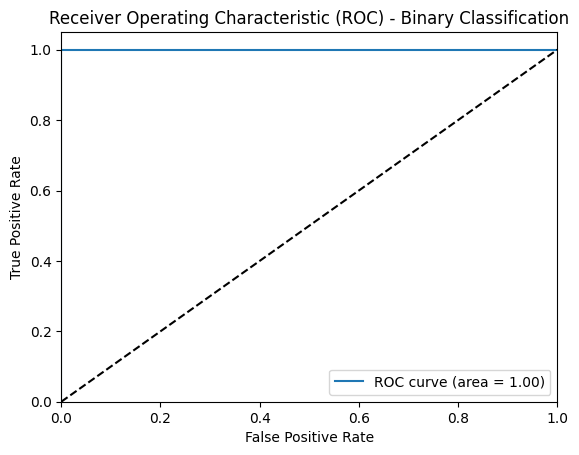

              precision    recall  f1-score   support

      NORMAL       1.00      0.88      0.93         8
   PNEUMONIA       0.89      1.00      0.94         8

    accuracy                           0.94        16
   macro avg       0.94      0.94      0.94        16
weighted avg       0.94      0.94      0.94        16



In [ ]:
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import numpy as np

# Binarize the output
lb = LabelBinarizer()
y_test = lb.fit_transform(validation_generator.classes)
y_pred = lb.transform(predictions)
classes = ['NORMAL', 'PNEUMONIA']

# For binary classification, predictions_prob should have shape (n_samples, 1)
# y_test = validation_generator.classes  # Assuming binary labels (0 or 1)
y_test = validation_generator.classes.reshape(-1, 1)  # Reshape to (n_samples, 1)

# Predict the output
predictions_prob_og = model.predict(validation_generator)

# Compute ROC curve and ROC area for the positive class (e.g., PNEUMONIA)
predictions_prob = predictions_prob_og[:, 1]  # Take the probability of the positive class
fpr, tpr, _ = roc_curve(y_test, predictions_prob)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = {0:0.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) - Binary Classification')
plt.legend(loc="lower right")
plt.show()

# Print classification report
y_pred = np.argmax(predictions_prob_og, axis=1)
print(classification_report(y_test, y_pred, target_names=classes))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


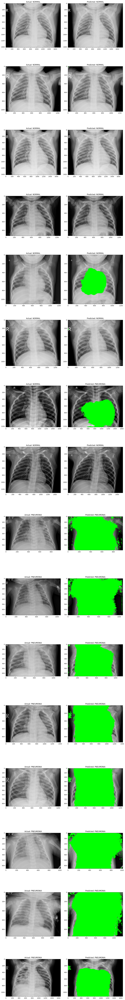

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Define the class names
classes = ['NORMAL', 'PNEUMONIA']

# Get predictions from the model
predictions_model_2 = model.layers[0].predict(validation_generator)
predictions_prob = model.predict(validation_generator)
predictions = np.argmax(predictions_prob, axis=1)

# Thresholding
threshold = 0.97  # Adjust threshold as needed for binary mask (if needed)
binary_mask = (predictions_model_2 > threshold).astype(np.uint8)

# Track displayed classes and their counts
displayed_classes_counts = {class_name: 0 for class_name in classes}

# Set maximum number of images to display per class
num_images_per_class = 8

# Total number of images in the validation directory
total_images = len(validation_generator.filenames)

# Prepare to display the images
plt.figure(figsize=(12, 6 * len(classes) * num_images_per_class))
image_index = 0

# Iterate through the images
for i in range(total_images):
    # Get the actual class index and name
    actual_class_index = validation_generator.classes[i]
    actual_class_name = classes[actual_class_index]

    # Check if we have already displayed the required number of images for this class
    if displayed_classes_counts[actual_class_name] >= num_images_per_class:
        continue

    # Load original image using generator path
    img_path = os.path.join(val_dir, validation_generator.filenames[i])
    original_image = cv2.imread(img_path)

    # Check if the image is loaded correctly
    if original_image is None:
        print(f"Warning: Image at path {img_path} could not be loaded.")
        continue

    # Convert the original image to RGB
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Resize the binary mask to match the shape of the original image
    reshaped_binary_mask = cv2.resize(binary_mask[i][:, :, 0], (original_image_rgb.shape[1], original_image_rgb.shape[0]))

    # Overlay mask on original image
    overlay = original_image_rgb.copy()
    overlay[reshaped_binary_mask == 1] = (0, 255, 0)  # Overlay mask in green color

    # Get predicted class name
    predicted_class_name = classes[predictions[i]]

    # Plot original image with overlayed mask
    plt.subplot(len(classes) * num_images_per_class, 2, 2 * image_index + 1)
    plt.imshow(original_image_rgb)
    plt.title(f'Actual: {actual_class_name}')

    plt.subplot(len(classes) * num_images_per_class, 2, 2 * image_index + 2)
    plt.imshow(overlay)
    plt.title(f'Predicted: {predicted_class_name}')

    # Mark this class as displayed
    displayed_classes_counts[actual_class_name] += 1
    image_index += 1

    # Break the loop if we've displayed the required number of images for all classes
    if all(count >= num_images_per_class for count in displayed_classes_counts.values()):
        break

plt.tight_layout()
plt.show()
